In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.special import expit
import os
os.environ["KMP_DUPLICATE_LIB_OK"]="TRUE"

import io
import imageio
from matplotlib import cm

from matplotlib.patches import Ellipse

import systems
import torch
import torchsde
import utils


In [156]:
from scipy.integrate import odeint
def batch_odeint(y0s,f,t):
    xs = []
    for y0 in y0s:
        xs.append(odeint(f, y0.T, t))
    return np.stack(xs)

In [157]:
def sample_spherical(npoints, ndim=3):
    vec = np.random.randn(ndim, npoints)
    vec /= np.linalg.norm(vec, axis=0)
    return vec

xrange, yrange, zrange = ((-30,30),(-40,40),(0,70))
cent = np.expand_dims(np.array([np.mean(xrange),np.mean(yrange),np.mean(zrange)]),axis=1)
cent = np.expand_dims(np.array([0,0,35]),axis=1)

abc = 2*np.expand_dims(np.array([30,40,35]),axis=1)
pnts = sample_spherical(1500,ndim=3)*abc + cent
pnts[:,0]

array([-58.95276796,  -0.21591978,  48.01996473])

In [164]:
f = lambda x,t: systems.lorentz(t,x)
Jf = systems.Jlorentz

t_size = 520
tf = .25
y0 = np.array(pnts[:,0])# interesting loop[ 1.35641339, -0.58946927, -2.27060091]
y0 = np.expand_dims(y0,0)
ts = np.linspace(0, tf, t_size)
yy = batch_odeint(y0, f, ts)


batch_size = 10000
init_spread = 1
y0 = y0.repeat(batch_size,0)
y0 += init_spread*np.random.randn(batch_size,3)
yo = batch_odeint(y0, f, ts)

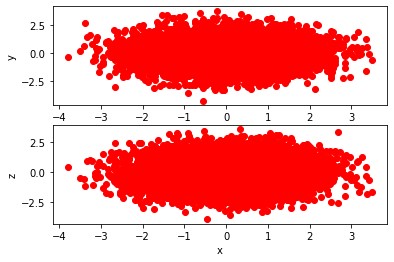

In [159]:
plt.figure()
plt.subplot(2,1,1)
plt.scatter(yo[:,0,0]-yy[:,0,0],yo[:,0,1]-yy[:,0,1],c='r')
plt.ylabel('y')
plt.subplot(2,1,2)
plt.scatter(yo[:,0,0]-yy[:,0,0],yo[:,0,2]-yy[:,0,2],c='r')
plt.ylabel('z')
plt.xlabel('x')
plt.show()

In [160]:
d = 3
q_bounds = [0,500]

dt = float(ts[1])
initial_sigma = init_spread
#Sigma = initial_sigma #for the arrival
Sigma = initial_sigma*np.eye(d) #for the plane
Sigmer = initial_sigma #for the plane
Sigmat = initial_sigma*np.eye(d-1) #for the plane

es = []
vs = []
Js = []
dts = []
Rss = []
print(Sigma)
rotation_manager = utils.rot_keeper(d=d)

for q in range(q_bounds[0],q_bounds[1],1):
    print(f'frame: {q}', end='\r')
    ff = f(yy[[0],q,:].T,0)
    nf = np.sqrt(np.sum(ff**2))
    Rs=rotation_manager.get_rot(ff)
    ooy = Rs@yy[0,q,:]
    J = np.array(Jf(yy[[0],[q],:].T.flatten()))
    Jr = Rs.T@J@Rs
    Rss.append(Rs)
    Js.append(Jr.copy())
    JRR = np.eye(d)+dt*Jr
    Sigma = JRR@Sigma@JRR.T
    GRR = np.eye(d-1)+dt*Jr[1:,1:]
    Sigmat = GRR@Sigmat@GRR.T
    Sigmer = (dt*Jr[0,0]+1)*Sigmer #+ dt**2*Jr[0,1:]@Sigmat@Jr[0,1:]#*(dt*Jr[0,0]+1) + dt**2*Jr[0,1:]@Sigmat@Jr[0,1:]
    #e,v=np.linalg.eig(Jr[1:,1:])
    #es.append(e.copy())
    #vs.append(v.copy())
    #dts.append(Jr[0,1:].copy())
print(Sigma)
print(Sigmat)
print(Sigmer)


[[1. 0. 0.]
 [0. 1. 0.]
 [0. 0. 1.]]
[[ 0.42662747 -0.02558255 -0.00177558]
 [-0.02558255  0.56023461 -0.3219209 ]
 [-0.00177558 -0.3219209   0.19226878]]
[[ 0.27607785 -0.12456909]
 [-0.12456909  0.09467765]]
0.3627571410859181


Text(0, 0.5, 'count')

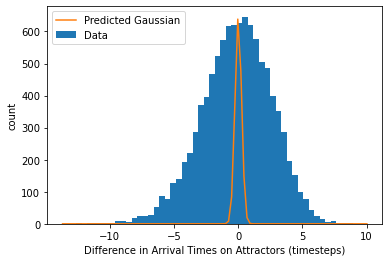

In [166]:
nbins = 50
tR = Rss[-1]
dy = yo[:,q_bounds[1],:]-yy[:,q_bounds[1],:]
dyR = tR@dy.T
plt.figure()
ax = plt.gca()
c,_=np.histogram(dyR[0]/np.sqrt(np.sum(ff**2)),nbins)
plt.hist(dyR[0]/np.sqrt(np.sum(ff**2)),nbins)
xl,xh = ax.get_xbound()
xe = np.linspace(xl,xh,100)
yep = np.exp(-xe**2/Sigmer**2)
gA = max(c)
plt.plot(xe,yep*gA)
plt.legend(['Predicted Gaussian','Data'])
plt.xlabel('Difference in Arrival Times on Attractors (timesteps)')
plt.ylabel('count')

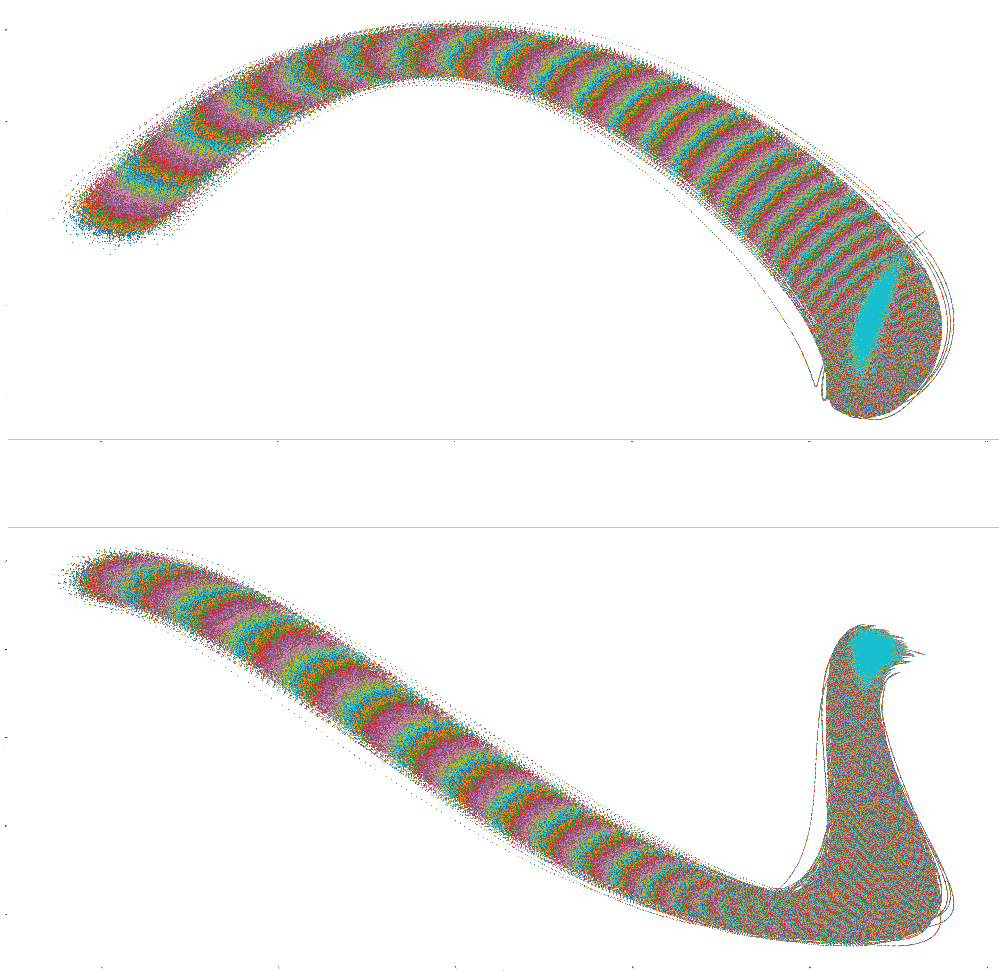

In [163]:
utils.plt3(yo)

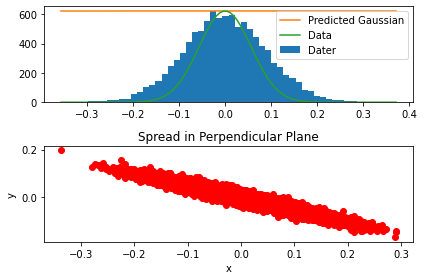

[[ 0.00789015  0.0062183  -0.00289195]
 [ 0.0062183   0.00629268 -0.00319845]
 [-0.00289195 -0.00319845  0.00178959]]
[[ 14.09880033 -26.17758208 -51.613303  ]
 [-26.17758208  48.67862406  96.03158448]
 [-51.613303    96.03158448 189.48705634]]


In [128]:
nbins = 50
tR = Rss[-1]
dy = yo[:,q_bounds[1],:]-yy[:,q_bounds[1],:]
dyR = tR@dy.T
plt.figure()
ax = plt.subplot(2,1,1)
c,_=np.histogram(dyR[0]/np.sqrt(np.sum(ff**2)),nbins)
ax.hist(dyR[0]/np.sqrt(np.sum(ff**2)),nbins)
xl,xh = ax.get_xbound()
xe = np.linspace(xl,xh,100)
ye = np.exp(-xe**2/Sigma[0,0]**2)
yep = np.exp(-xe**2/Sigmer**2)
gA = max(c)
plt.plot(xe,ye*gA)
plt.plot(xe,yep*gA)
plt.legend(['Predicted Gaussian','Data','Dater'])
plt.subplot(2,1,2)
plt.title('Spread in Perpendicular Plane')
plt.scatter(dyR[1],dyR[2],c='r')
plt.ylabel('y')
plt.xlabel('x')
plt.tight_layout()
plt.show()
print(np.cov(dyR))
print(Sigma)

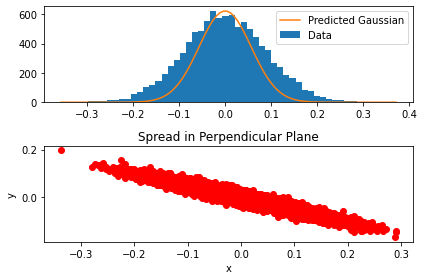

[[ 0.00789015  0.0062183  -0.00289195]
 [ 0.0062183   0.00629268 -0.00319845]
 [-0.00289195 -0.00319845  0.00178959]]
[[ 14.09880033 -26.17758208 -51.613303  ]
 [-26.17758208  48.67862406  96.03158448]
 [-51.613303    96.03158448 189.48705634]]


In [129]:
nbins = 50
tR = Rss[-1]
dy = yo[:,q_bounds[1],:]-yy[:,q_bounds[1],:]
dyR = tR@dy.T
plt.figure()
ax = plt.subplot(2,1,1)
c,_=np.histogram(dyR[0],nbins)
ax.hist(dyR[0],nbins)
xl,xh = ax.get_xbound()
xe = np.linspace(xl,xh,100)
ye = np.exp(-xe**2/Sigma[0,0]**2)
yep = np.exp(-xe**2/Sigmer**2)
gA = max(c)
plt.plot(xe,yep*gA)
plt.legend(['Predicted Gaussian','Data'])
plt.subplot(2,1,2)
plt.title('Spread in Perpendicular Plane')
plt.scatter(dyR[1],dyR[2],c='r')
plt.ylabel('y')
plt.xlabel('x')
plt.tight_layout()
plt.show()
print(np.cov(dyR))
print(Sigma)

In [130]:
e,v = np.linalg.eig(Sigmat)
print(e)
print(v)

[6.73925445e-06 3.26744938e+00]
[[-0.98337849 -0.18156745]
 [ 0.18156745 -0.98337849]]


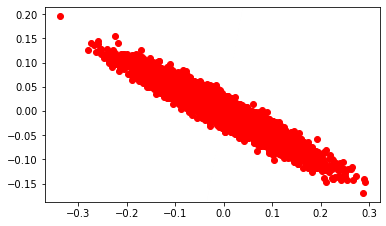

In [131]:
plt.figure()
ax = plt.subplot(111, aspect='equal')
plt.scatter(dyR[1],dyR[2],c='r')

ell = Ellipse(xy=(0,0),
              width=e[1], height=e[0],
              angle=np.rad2deg(np.arctan2(v[0,0],v[0,1])))
ax.add_artist(ell)
plt.show()

In [102]:
np.sqrt(np.sum(ff**2))*dt

0.0004816955684007707

In [62]:
d = 3
q_bounds = [0,100]

dt = float(ts[1])
initial_sigma = init_spread
#Sigma = initial_sigma #for the arrival
sigmer = initial_sigma #for the plane
Sigmat = initial_sigma*np.eye(d-1) #for the plane

es = []
vs = []
Js = []
dts = []
Rss = []
print(sigmer)
print(Sigmat)
rotation_manager = utils.rot_keeper(d=d)

for q in range(q_bounds[0],q_bounds[1],1):
    print(f'frame: {q}', end='\r')
    ff = f(yy[[0],q,:].T,0)
    nf = np.sqrt(np.sum(ff**2))
    Rs=rotation_manager.get_rot(ff)
    ooy = Rs@yy[0,q,:]
    J = np.array(Jf(yy[[0],[q],:].T.flatten()))
    Jr = Rs.T@J@Rs
    GRR = np.eye(d-1)+dt*Jr[1:,1:]
    Sigmat = GRR@Sigmat@GRR.T
    sigmer = (dt*Jr[0,0]+1)*sigmer #+ dt**2*Jr[0,1:]@Sigmat@Jr[0,1:]#*(dt*Jr[0,0]+1) + dt**2*Jr[0,1:]@Sigmat@Jr[0,1:]
    #e,v=np.linalg.eig(Jr[1:,1:])
    #es.append(e.copy())
    #vs.append(v.copy())
    #dts.append(Jr[0,1:].copy())
print(sigmer)
print(Sigmat)


0.1
[[0.1 0. ]
 [0.  0.1]]
0.05594405869457134
[[ 0.14408936 -0.04327522]
 [-0.04327522  0.07298268]]


In [57]:
np.sum(Sigma[:,2])

-0.03192423791604148

In [58]:
nbins = 50
tR = Rss[-1]
dy = yo[:,q_bounds[1],:]-yy[:,q_bounds[1],:]
dyR = tR@dy.T
plt.figure()
ax = plt.subplot(2,1,1)
c,_=np.histogram(dyR[0],nbins)
ax.hist(dyR[0],nbins)
xl,xh = ax.get_xbound()
xe = np.linspace(xl,xh,100)
ye = np.exp(-xe**2/Sigma[0,0]**2)
gA = max(c)
plt.plot(xe,ye*gA)
plt.legend(['Predicted Gaussian','Data'])
plt.subplot(2,1,2)
plt.title('Spread in Perpendicular Plane')
plt.scatter(dyR[1],dyR[2],c='r')
plt.ylabel('y')
plt.xlabel('x')
plt.tight_layout()
plt.show()
print(np.cov(dyR))
print(Sigma)

IndexError: list index out of range